In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.signal import correlate2d
import cv2
from scipy import signal
import tensorflow as tf

In [2]:
train_df = pd.read_csv('data/train.csv')
test_df = pd.read_csv('data/test.csv')

In [3]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1714 entries, 0 to 1713
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   label         1714 non-null   int64  
 1   latitude      1714 non-null   float64
 2   longitude     1714 non-null   float64
 3   year          1714 non-null   int64  
 4   example_path  1714 non-null   object 
dtypes: float64(2), int64(2), object(1)
memory usage: 67.1+ KB


In [4]:
fig = px.density_heatmap(train_df, x="longitude", y="latitude", marginal_x="histogram", marginal_y="histogram", width=700, height=700, nbinsx=100, nbinsy=100)
fig.show(filename='basic-line')

In [5]:
fig = px.density_heatmap(test_df, x="longitude", y="latitude", marginal_x="histogram", marginal_y="histogram", width=700, height=700, nbinsx=100, nbinsy=100)
fig.show(filename='basic-line')

In [6]:
fig = px.scatter_mapbox(train_df,
                        lat="latitude",
                        lon="longitude",
                        zoom=4,
                        color="label",
                        height=900,
                        width=1300)
fig.update_layout(mapbox_style='carto-positron')
# fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

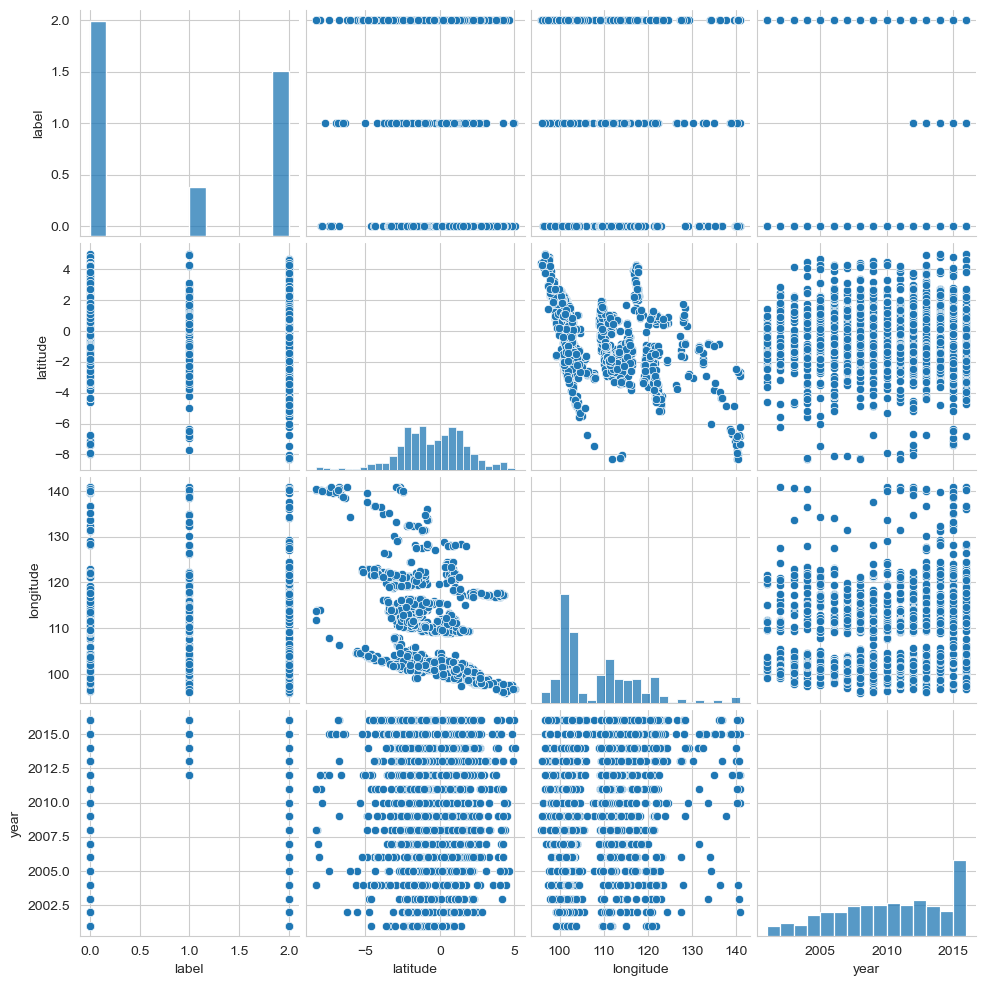

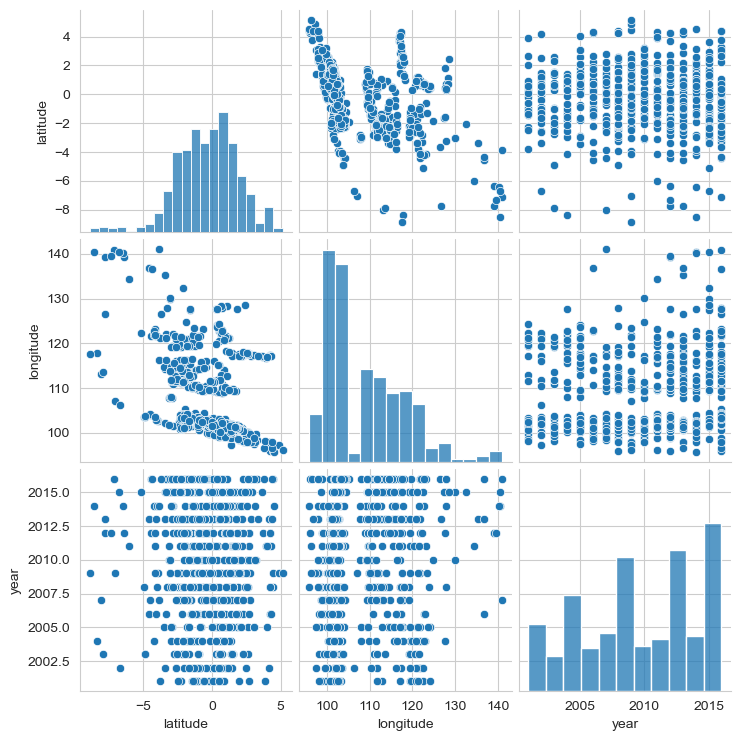

In [7]:
sns.pairplot(train_df)
sns.pairplot(test_df)

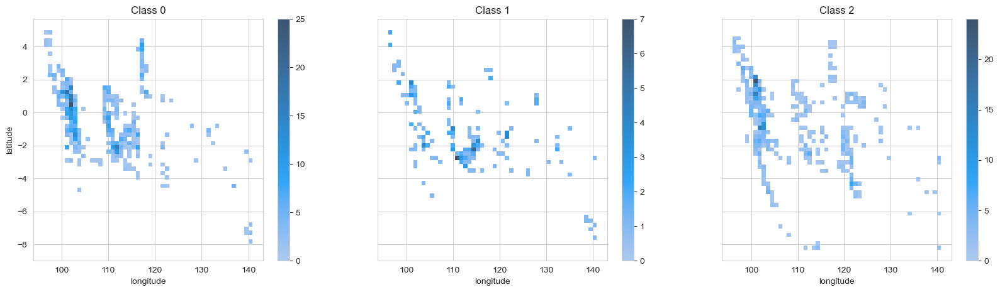

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
n_labels = len(np.unique(train_df['label']))
for index, label in enumerate(np.unique(train_df['label'])):
    data_ = train_df[train_df['label']==label]
    title = 'Class ' + str(int(label))
    sns.histplot(data=data_, x="longitude", y="latitude", cbar=True, bins=50, ax=axes[index]).set(title=title)
plt.show()

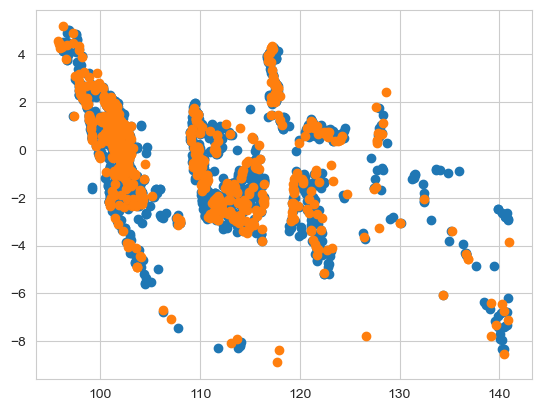

In [9]:
plt.scatter(train_df['longitude'], train_df['latitude'])
plt.scatter(test_df['longitude'], test_df['latitude'])
plt.show()

In [10]:
train_df.head()

,label,latitude,longitude,year,example_path
0,0,-2.051853,111.826093,2001,train_test_data/train/1297.png
1,2,-1.989349,105.309496,2013,train_test_data/train/1199.png
2,0,1.223256,100.702217,2014,train_test_data/train/1348.png
3,0,-2.342948,103.890226,2008,train_test_data/train/2214.png
4,0,-0.126555,101.758175,2011,train_test_data/train/2220.png


In [11]:
def hisEqulColor(img):
    ycrcb=cv2.cvtColor(img,cv2.COLOR_BGR2YCR_CB)
    channels=cv2.split(ycrcb)
    hist = cv2.equalizeHist(channels[0])
    ycrcb = cv2.merge((hist,  channels[1], channels[2]))
    img = cv2.cvtColor(ycrcb,cv2.COLOR_YCR_CB2BGR)
    return img

def hisEqulColorHSV(img):
    hsv=cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    channels=cv2.split(hsv)
    hist = cv2.equalizeHist(channels[2])
    hsv = cv2.merge((channels[0],  channels[1], hist))
    img = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)
    return img

In [12]:
sep_classes = [train_df[train_df['label']==0], train_df[train_df['label']==1], train_df[train_df['label']==2]]

In [15]:
def combined_filter(img, mask1, mask2):
    conv1 = np.zeros(img.shape)
    conv2 = np.zeros(img.shape)
    for i in range(3):
        conv1[:, :, i] = signal.convolve2d(img[:, :, i], mask1, mode='same', boundary='symm')
        conv2[:, :, i] = signal.convolve2d(img[:, :, i], mask2, mode='same', boundary='symm')
        # conv3[:, :, i] = signal.convolve2d(img[:, :, i], mask3, mode='same', boundary='symm')

    # conv1 = signal.convolve3d(img, mask1, mode="same")
    # conv2 = signal.convolve3d(img, mask2, mode="same")
    return np.sqrt(conv1**2 + conv2**2)

In [20]:
s1 = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
s2 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])

In [24]:
def edge_rec(class_n):
    n_pics = 4
    paths = sep_classes[class_n]['example_path'].sample(n_pics).to_list()
    fig, ax = plt.subplots(n_pics, 5)
    fig.set_size_inches(15,12)
    for i, path in enumerate(paths):
        filepath = 'data/' + path
        img_ = cv2.imread(filepath)
        img_ycrcb = hisEqulColor(img_)
        img_hsv = hisEqulColorHSV(img_)
        ax[i, 0].imshow(img_)
        ax[i, 1].imshow(img_ycrcb)
        ax[i, 2].imshow(img_hsv)
        ax[i, 3].imshow(combined_filter(img_ycrcb/255,s1,s2))
        ax[i, 4].imshow(combined_filter(img_hsv/255,s1,s2))
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


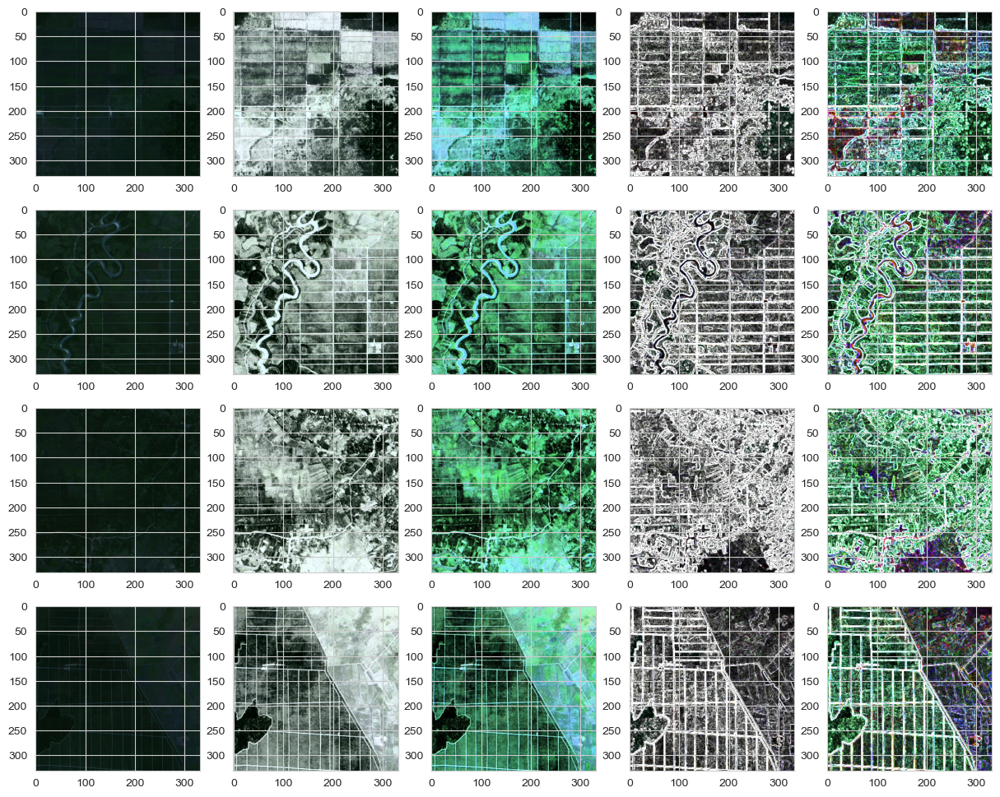

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


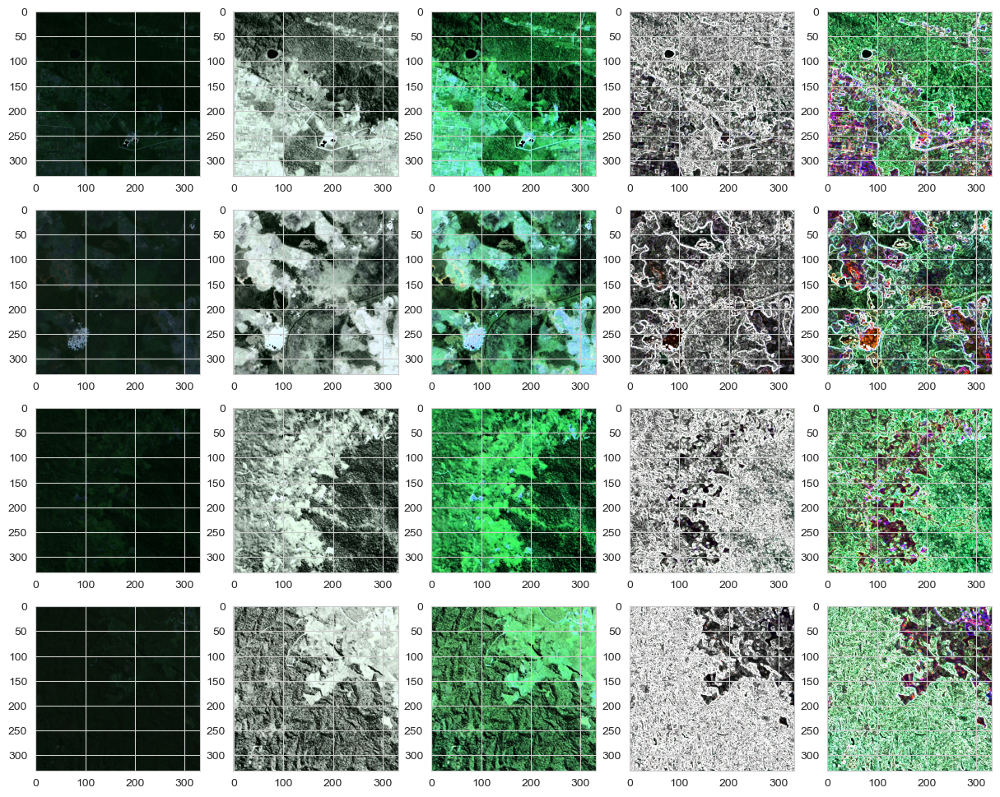

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


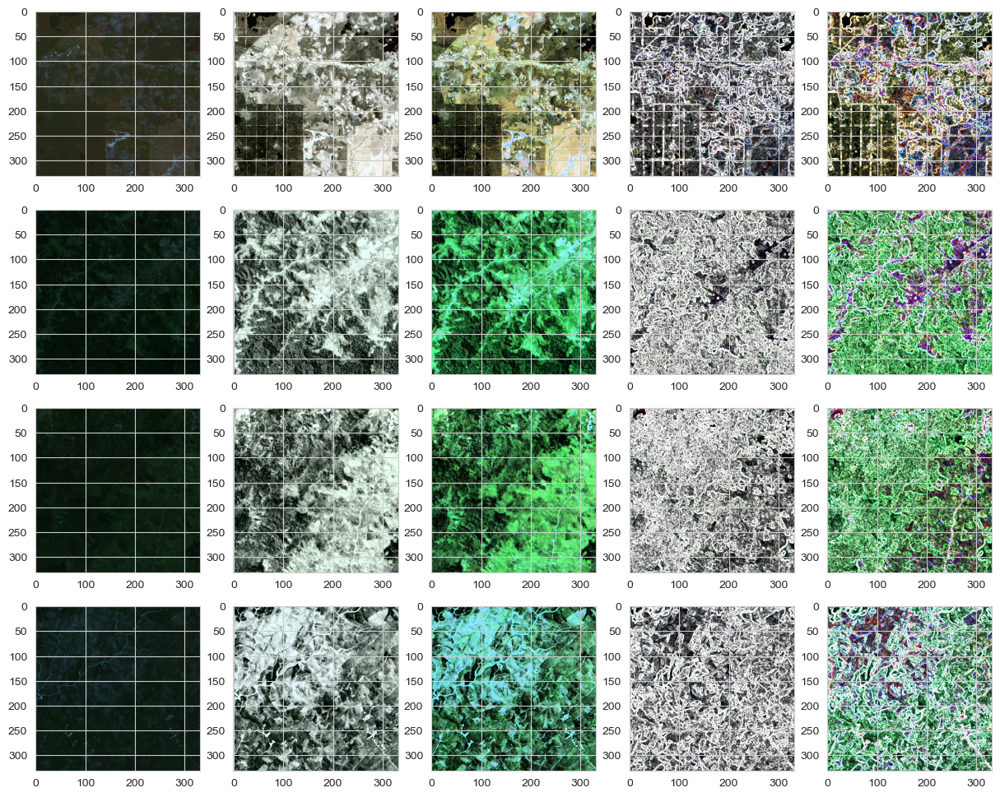

In [25]:
edge_rec(0)
edge_rec(1)
edge_rec(2)

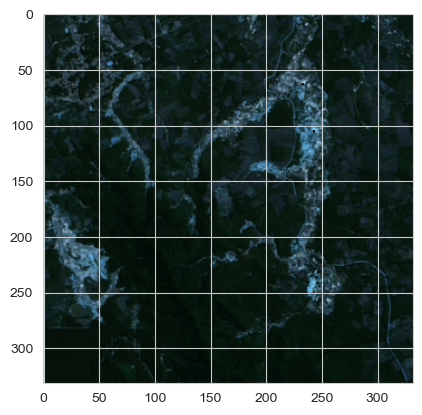

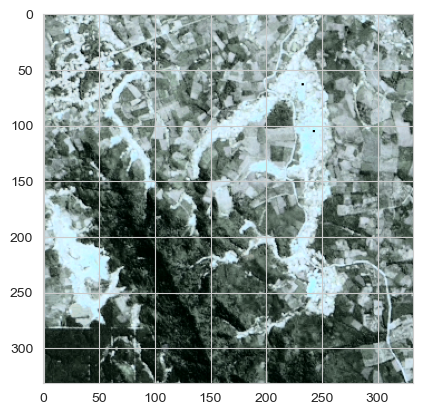

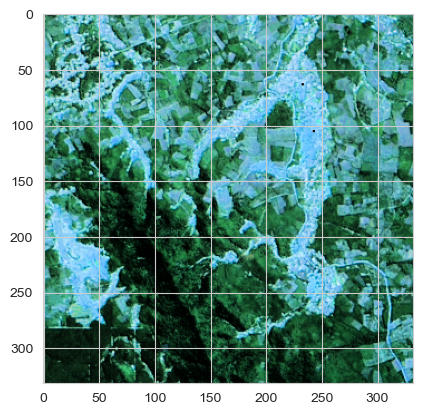

In [26]:
path = 'data/' + 'train_test_data/train/1199.png'

img_=cv2.imread(path)
img2 = hisEqulColor(img_)
img3 = hisEqulColorHSV(img_)

plt.imshow(img_)
plt.show()
plt.imshow(img2)
plt.show()
plt.imshow(img3)
plt.show()

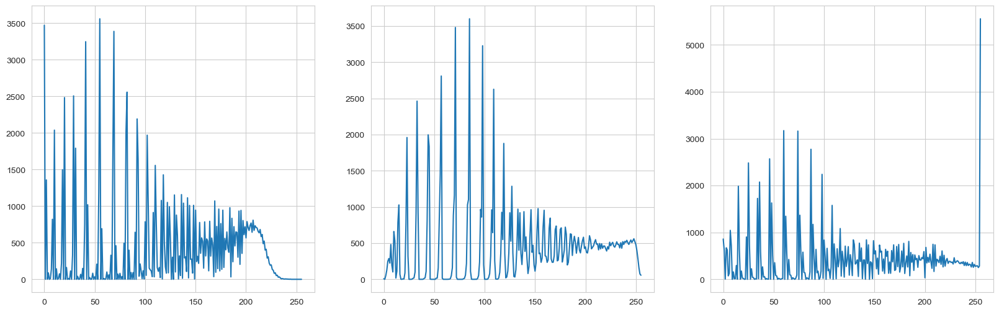

In [27]:
fig, ax = plt.subplots(1,3, figsize=(20, 6))
ax[0].plot(cv2.calcHist([img2],[0],None,[256],[0,256]))
ax[1].plot(cv2.calcHist([img2],[1],None,[256],[0,256]))
ax[2].plot(cv2.calcHist([img2],[2],None,[256],[0,256]))
plt.show()

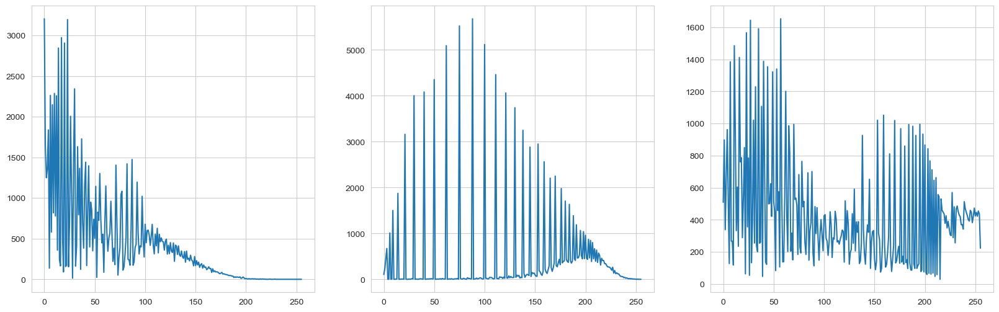

In [28]:
fig, ax = plt.subplots(1,3, figsize=(20, 6))
ax[0].plot(cv2.calcHist([img3],[0],None,[256],[0,256]))
ax[1].plot(cv2.calcHist([img3],[1],None,[256],[0,256]))
ax[2].plot(cv2.calcHist([img3],[2],None,[256],[0,256]))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


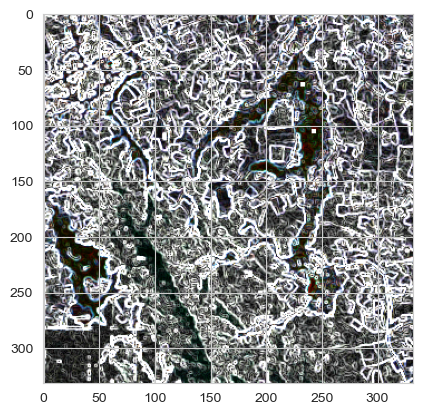

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


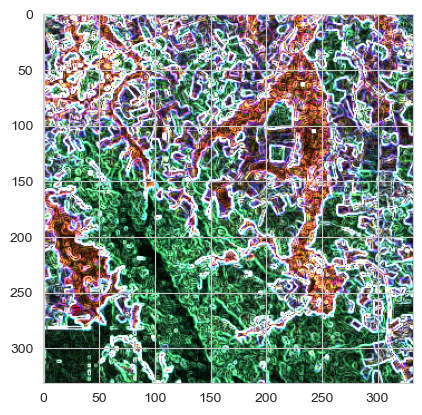

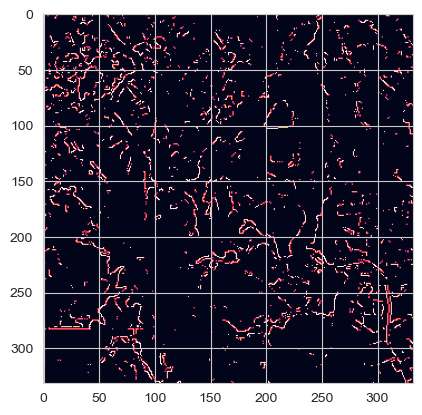

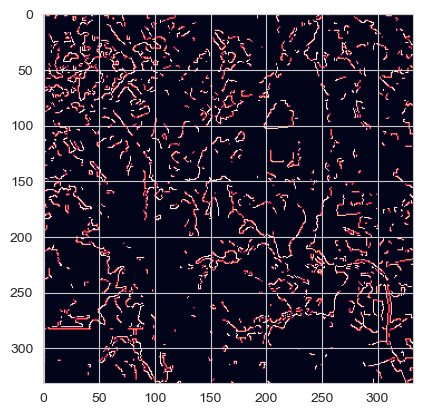

In [29]:

plt.imshow(combined_filter(img2/255,s1,s2))
plt.show()
plt.imshow(combined_filter(img3/255,s1,s2))
plt.show()
# plt.imshow(cv2.Canny(image=img2, threshold1=100, threshold2=300))
# plt.show()
# plt.imshow(cv2.Canny(image=img2, threshold1=100, threshold2=200))
# plt.show()
plt.imshow(cv2.Canny(image=img2, threshold1=500, threshold2=500))
plt.show()
plt.imshow(cv2.Canny(image=img2, threshold1=400, threshold2=500))
plt.show()

In [30]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, accuracy_score, mean_squared_error

In [31]:
y = np.array(train_df['label']).reshape(-1,1)

In [32]:
X = np.array(train_df[['latitude','longitude']])

In [33]:
x_train, x_test, y_train, y_test = train_test_split(X, y,test_size=0.2,random_state=42)

In [34]:
tree_depth = 3
tree_clf = DecisionTreeClassifier(max_depth=tree_depth, random_state=42)
tree_clf.fit(x_train,y_train)

f1tr = f1_score(y_train,tree_clf.predict(x_train), average='weighted')
f1te = f1_score(y_test,tree_clf.predict(x_test), average='weighted')
acctr = accuracy_score(y_train,tree_clf.predict(x_train))
accte = accuracy_score(y_test,tree_clf.predict(x_test))

print(f1tr, f1te, acctr, accte)

0.5987245070476322 0.5283517889234677 0.6345733041575492 0.5743440233236151


In [35]:
from sklearn.ensemble import RandomForestClassifier

rnd_clf = RandomForestClassifier(n_estimators=10)

rnd_clf.fit(x_train,y_train)

f1tr = f1_score(y_train,rnd_clf.predict(x_train), average='weighted')
f1te = f1_score(y_test,rnd_clf.predict(x_test), average='weighted')
acctr = accuracy_score(y_train,rnd_clf.predict(x_train))
accte = accuracy_score(y_test,rnd_clf.predict(x_test))

print(f1tr, f1te, acctr, accte)

0.9707806805732685 0.6588672237697307 0.9708242159008024 0.6676384839650146


/var/folders/gw/dxsgcp3j6sj0njrkfq6bp_8h0000gp/T/ipykernel_19834/2891306283.py:5: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [36]:
from sklearn.ensemble import GradientBoostingClassifier

gbc_clf = GradientBoostingClassifier(n_estimators=10)
gbc_clf.fit(x_train,y_train)

f1tr = f1_score(y_train,gbc_clf.predict(x_train), average='weighted')
f1te = f1_score(y_test,gbc_clf.predict(x_test), average='weighted')
acctr = accuracy_score(y_train,gbc_clf.predict(x_train))
accte = accuracy_score(y_test,gbc_clf.predict(x_test))

print(f1tr, f1te, acctr, accte)

0.6188964255001427 0.5457773839448549 0.6549963530269876 0.5918367346938775


/Users/maciejkrajewskistudia/.conda/envs/kaggle_competitions/lib/python3.8/site-packages/sklearn/ensemble/_gb.py:570: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Read in train pictures

In [39]:
image_paths_per_class = train_df.groupby("label")["example_path"].apply(list).to_dict()
images_per_class = {
    label: [cv2.imread(path) for path in paths]
    for label, paths in image_paths_per_class.items()
}

Let's see the distribution of classes

In [53]:
{label: len(images) for label, images in images_per_class.items()}

{0: 860, 1: 196, 2: 658}

We will need to augment the data in order to make every class representative

Read in test pictures

In [40]:
test_pictures_paths = test_df["example_path"].tolist()
test_images = [cv2.imread(path) for path in test_pictures_paths]


Preprocess data using hsv

In [41]:
def preprocess_picture(img):
    img_hsv_normalized = hisEqulColorHSV(img)
    filtered_hsv = combined_filter(img_hsv_normalized/255,s1,s2)
    return filtered_hsv

Preprocessing data

In [45]:
preprocessed_test_images = [preprocess_picture(img) for img in test_images]

In [46]:
preproccesed_train_images = {
    label: [preprocess_picture(img) for img in class_images]
    for label, class_images in images_per_class.items()
}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


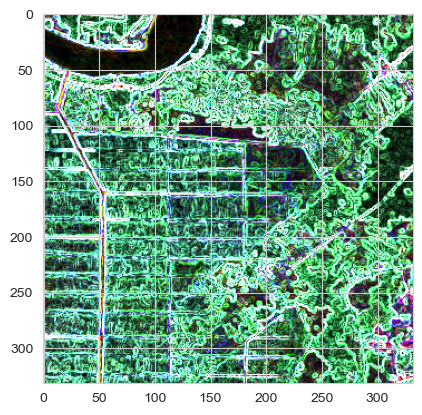

In [49]:
plt.imshow(preprocessed_test_images[100])
plt.show()

Converting data to tensors

In [52]:
train_labels, train_data = [], []
for label, pictures in preproccesed_train_images.items():
    class_size = len(pictures)
    label_tensor = [label] * class_size
    data_tensor = tf.convert_to_tensor(pictures)
    train_labels.extend(label_tensor)
    train_data.append(data_tensor)

labels = tf.one_hot(train_labels, 3)
train_data = tf.convert_to_tensor(np.concatenate(train_data))

2022-11-19 17:43:58.139470: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


As we have seen previously the data need to be augmented

Defining model